# CONTENTS

    1.Introduction
    2.Assumption
    3.Importing Libraries
    4.User define Functions
    5.Importing Data
    6.EDA - Exploratory Data Analysis
    7.Data Transormation
         * Data cleaning
         * Feature Selection
         * Feature Engneering
         * Feature Scaling
    8.Model Building
         * Linear Regression
         * Decision Tree
         * Decision Tree with GridSearchCV
         * Random Forest
         * Random Forest with GridSearchCV
    9.Conclusion



## Introduction

### Data information

Detailed specs from a wide range of modern notebooks and laptops ranging from Apple MacBook and Lenovo ThinkPad, over Gigabyte gaming laptops to Microsoft Surface tablets.

The data set consists of the followings variables:

        1.  Manufacturer
        2.  Model Name
        3.  Category
        4.  Screen Size
        5.  Screen
        6.  CPU
        7.  RAM
        8.  Storage
        9.  GPU
        10. Operating System
        11. Operating System Version
        12. Weight
        13. Price (Euros)
        
### Aim:
         To build a reliable and sutable model for preciction of the price (euros) of the laptops based on the previous data and check the metrics for the model

## Assumptions
 
    * The prices of the products is effected by both the internal (specifications) & external factors (marcket conditions).
    * Missing values for any specific feature is considered as the product wont have that feature.
    * Any justified values is acctable
            - prescence of high ram boosts the performence
            - prescence of high storage is prefarrable

## Importing Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math

pd.set_option('display.max_rows',None)
pd.set_option('display.max_columns',None)
np.set_printoptions(suppress=True)
pd.options.display.float_format ='{:.6f}'.format
import os
os.chdir=(r'C:\Users\chand\Desktop\Data science\Capstone Project 1')


import statsmodels
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.tools.eval_measures import rmse
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn import metrics
from sklearn.model_selection import train_test_split

from sklearn.linear_model import SGDRegressor
from sklearn.tree import DecisionTreeRegressor,plot_tree
from sklearn.tree import export_graphviz
import graphviz
from sklearn.model_selection import GridSearchCV, cross_val_score, cross_val_predict, train_test_split


from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from statsmodels.stats.outliers_influence import variance_inflation_factor

### Importing data

In [2]:
# importing of the laptops dataset
laptops=pd.read_csv(r"C:\Users\chand\Desktop\Data science\Capstone Project 1\laptops.csv", encoding='ISO-8859-1',sep=',')
laptops.head()

,Manufacturer,Model Name,Category,Screen Size,Screen,CPU,RAM,Storage,GPU,Operating System,Operating System Version,Weight,Price (Euros)
0,Apple,MacBook Pro,Ultrabook,"13.3""",IPS Panel Retina Display 2560x1600,Intel Core i5 2.3GHz,8GB,128GB SSD,Intel Iris Plus Graphics 640,macOS,NaN,1.37kg,"1339,69"
1,Apple,Macbook Air,Ultrabook,"13.3""",1440x900,Intel Core i5 1.8GHz,8GB,128GB Flash Storage,Intel HD Graphics 6000,macOS,NaN,1.34kg,"898,94"
2,HP,250 G6,Notebook,"15.6""",Full HD 1920x1080,Intel Core i5 7200U 2.5GHz,8GB,256GB SSD,Intel HD Graphics 620,No OS,NaN,1.86kg,"575,00"
3,Apple,MacBook Pro,Ultrabook,"15.4""",IPS Panel Retina Display 2880x1800,Intel Core i7 2.7GHz,16GB,512GB SSD,AMD Radeon Pro 455,macOS,NaN,1.83kg,"2537,45"
4,Apple,MacBook Pro,Ultrabook,"13.3""",IPS Panel Retina Display 2560x1600,Intel Core i5 3.1GHz,8GB,256GB SSD,Intel Iris Plus Graphics 650,macOS,NaN,1.37kg,"1803,60"


### Description of data

In [3]:
# The shape of the data is
laptops.shape

(1303, 13)

In [4]:
# The dtypes of variables present with in the dataset
laptops.dtypes

Manufacturer                object
Model Name                  object
Category                    object
Screen Size                 object
Screen                      object
CPU                         object
RAM                         object
 Storage                    object
GPU                         object
Operating System            object
Operating System Version    object
Weight                      object
Price (Euros)               object
dtype: object

In [5]:
# General information of the data
laptops.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1303 entries, 0 to 1302
Data columns (total 13 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Manufacturer              1303 non-null   object
 1   Model Name                1303 non-null   object
 2   Category                  1303 non-null   object
 3   Screen Size               1303 non-null   object
 4   Screen                    1303 non-null   object
 5   CPU                       1303 non-null   object
 6   RAM                       1303 non-null   object
 7    Storage                  1303 non-null   object
 8   GPU                       1303 non-null   object
 9   Operating System          1303 non-null   object
 10  Operating System Version  1133 non-null   object
 11  Weight                    1303 non-null   object
 12  Price (Euros)             1303 non-null   object
dtypes: object(13)
memory usage: 132.5+ KB


In [6]:
# general description of the data
laptops.describe().T

,count,unique,top,freq
Manufacturer,1303,19,Dell,297
Model Name,1303,618,XPS 13,30
Category,1303,6,Notebook,727
Screen Size,1303,18,"15.6""",665
Screen,1303,40,Full HD 1920x1080,507
CPU,1303,118,Intel Core i5 7200U 2.5GHz,190
RAM,1303,9,8GB,619
Storage,1303,38,256GB SSD,412
GPU,1303,110,Intel HD Graphics 620,281
Operating System,1303,7,Windows,1125


In [7]:
# checking for the missing values
laptops.isnull().sum()

Manufacturer                  0
Model Name                    0
Category                      0
Screen Size                   0
Screen                        0
CPU                           0
RAM                           0
 Storage                      0
GPU                           0
Operating System              0
Operating System Version    170
Weight                        0
Price (Euros)                 0
dtype: int64

## Exploratory Data Analysis

#### The EDA part has been performed after the feature engneering, feature cleaning and feature selection 

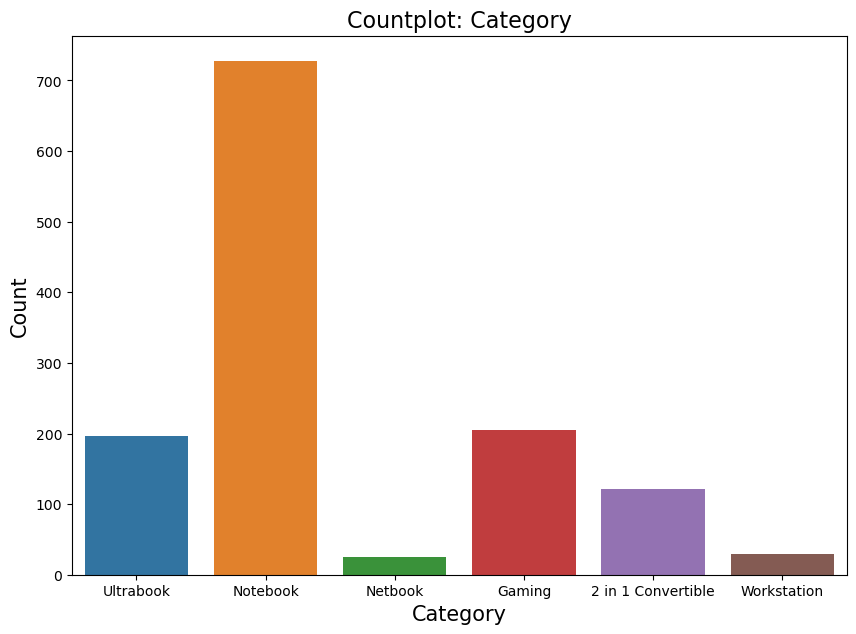

In [8]:
plt.figure(figsize=(10,7))
sns.countplot(x=laptops['Category'])
plt.title('Countplot: Category',fontsize=16)
plt.xlabel("Category",fontsize=15)
plt.ylabel("Count",fontsize=15)
plt.show()

Text(0.5, 1.0, 'size to cat')

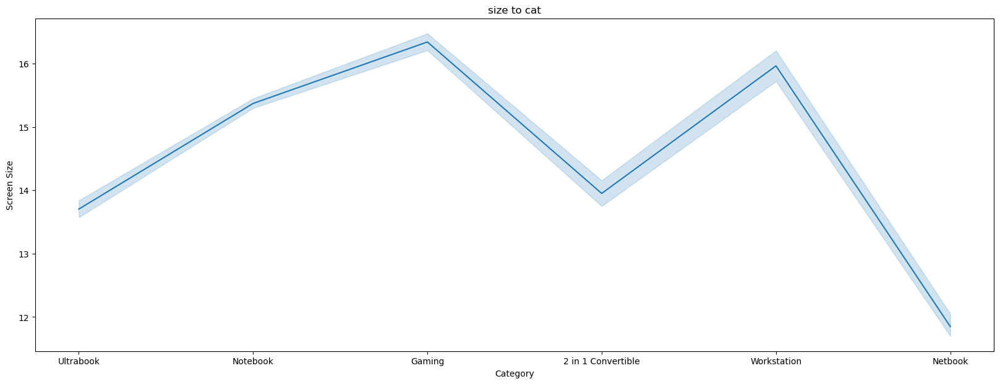

In [278]:
plt.figure(figsize=(20,7))
sns.lineplot(x=laptops['Category'],y=laptops['Screen Size'])
plt.title('size to cat')

Text(0.5, 1.0, 'storage to cat')

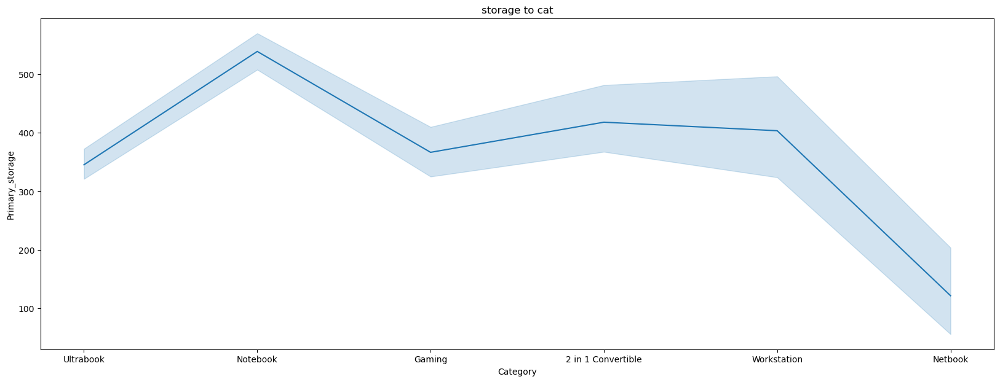

In [35]:
plt.figure(figsize=(20,7))
sns.lineplot(x=laptops['Category'],y=laptops['Primary_storage'])
plt.title('storage to cat')

Text(0.5, 1.0, 'storage to cat')

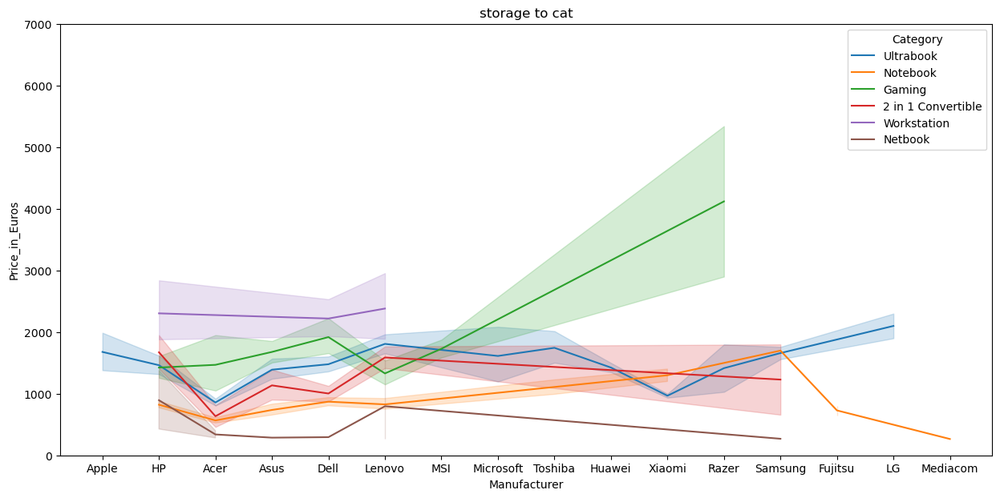

In [297]:
plt.figure(figsize=(15,7))
sns.lineplot(x=laptops['Manufacturer'],y=laptops['Price_in_Euros'],hue=laptops['Category'])
plt.ylim([0,7000])
plt.title('storage to cat')

# Data Proprocessing

### Feature Engneering

The creation of the new variabes/features basad on the existing features is called as feature engneering
creating the new variables is neceassary to convert the complex data into simple data to make the data feedable for the Machine learning model

In [8]:

laptops['Model Name']=[((i.replace('-',' ')).split(' ')[0]).upper() for i in laptops['Model Name'].replace('-',' ')]

laptops['Price_in_Euros']=pd.to_numeric([i.replace(',','.') for i in laptops['Price (Euros)']]).astype(int)

laptops['RAM_in_GB']=pd.to_numeric([i.replace('GB','') for i in laptops["RAM"]])

laptops['Weight_in_kgs']=pd.to_numeric([i.replace('kg','') for i in [i.replace('s','') for i in laptops["Weight"]]])

laptops['Storage_Type']= [i[-3:] if  i[-3:] == "SSD"  else 'HDD' for i in laptops[' Storage']  ]


laptops['Primary_sto']=[i.split(' ')[0] for i in laptops[' Storage']]
laptops['Primary_storage']=pd.to_numeric([i[:-2]  if int(i[:-2]) >10 else int(i[:-2])*1024 for i in laptops['Primary_sto']])


laptops['Secondary_sto']=pd.to_numeric([i.split(' ')[-2][:-2] if len(i.split(' ')) > 3 else 0 for i in laptops[' Storage']],errors='coerce')
laptops['Secondary_storage']=[i*1024 if math.isnan(i) == False and i < 10 else i for i in laptops['Secondary_sto']]


laptops['Resolution']=[i.split(' ')[-1] for i in laptops['Screen']]

laptops['Display']=[' '.join(i.split(' ')[:-1]) if len(i.split(' ')) > 1 else 'IPS Panel' for i in laptops['Screen']]

laptops['Processor'] = [ ' '.join(i.split(' ')[:3]) if i.split(' ')[0]=='Intel'  else ' '.join(i.split(' ')[:3]) for i in laptops['CPU']]

laptops['Clock_speed_in_GHZ']=pd.to_numeric([i.split(' ')[-1][:-3] for i in laptops['CPU']])


laptops['Screen Size']=pd.to_numeric([i[:-1] for i in laptops['Screen Size']])

laptops['Genaration']=[i.split(' ')[-2] if len(i.split(' ')) >= 4 else 'N/A' for i in laptops['CPU']]

laptops['Graphics']=[' '.join(i.split(" ")[:-1]) if len(i.split(" ")) >=4 else i for i in laptops['GPU']]

In [9]:
laptops.shape

(1303, 27)

### Outliers 

the values is justifies with the other specifications of the product 
only the extreame values are selected to eliminate

Index(['Screen Size', 'Price_in_Euros', 'RAM_in_GB', 'Weight_in_kgs',
       'Primary_storage', 'Secondary_sto', 'Secondary_storage',
       'Clock_speed_in_GHZ'],
      dtype='object')


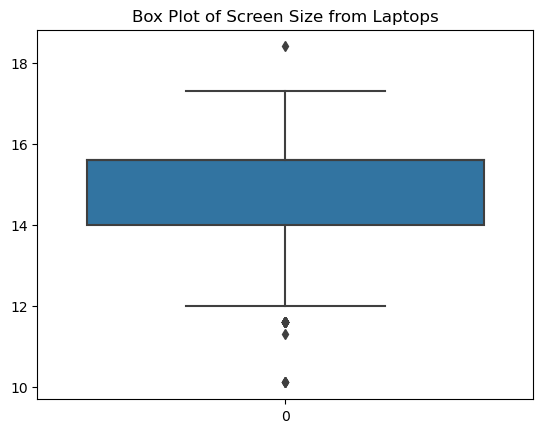

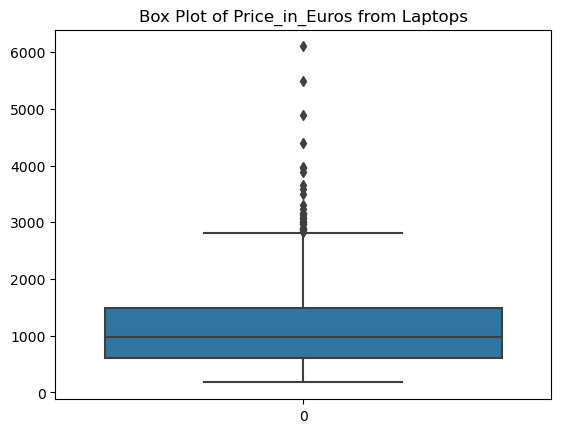

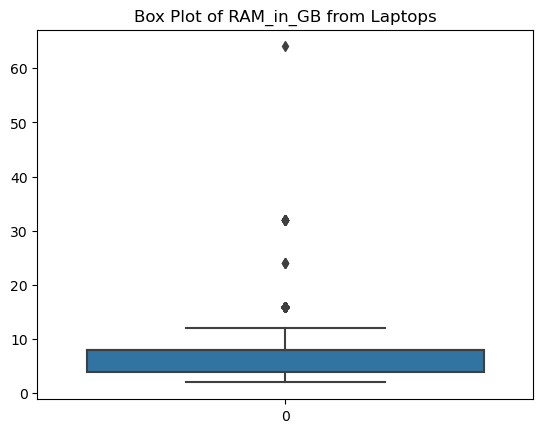

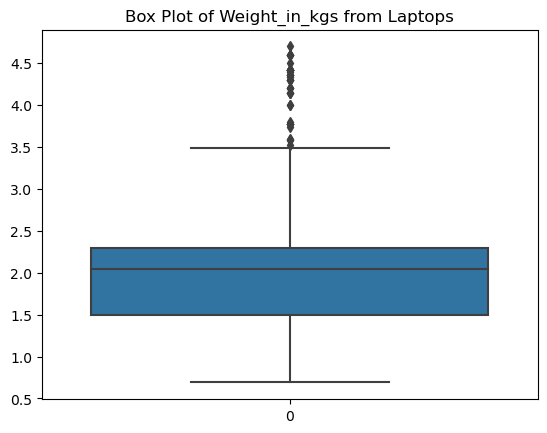

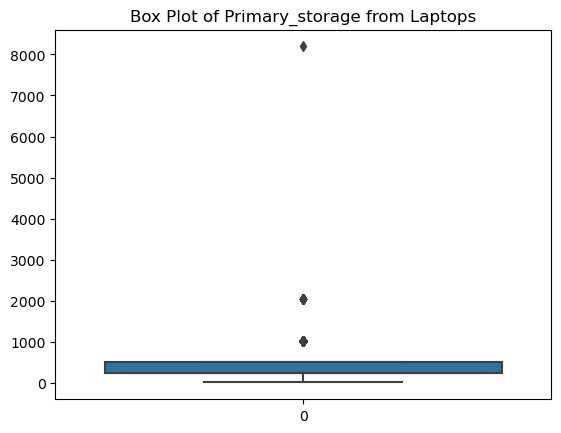

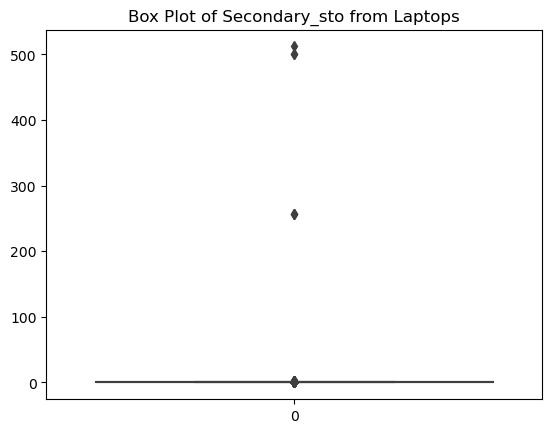

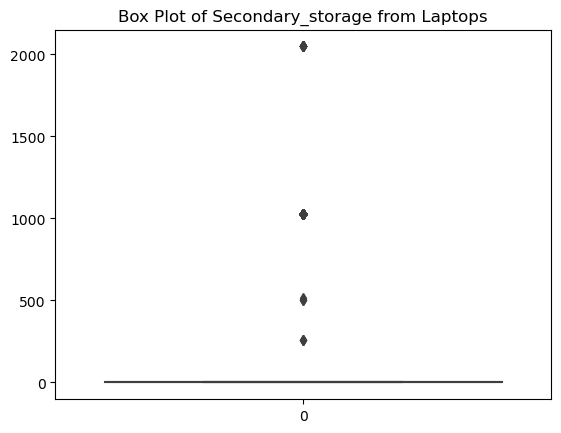

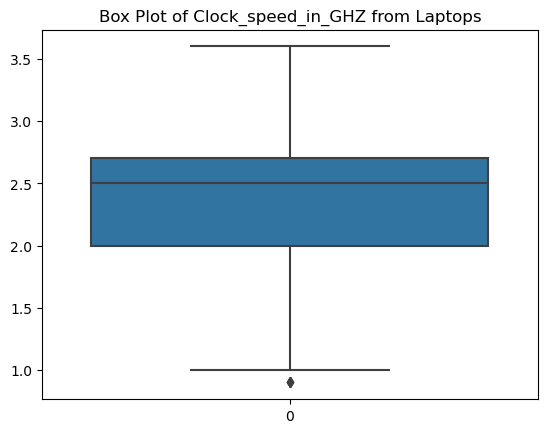

In [10]:
num_list=laptops.select_dtypes(include=np.number).columns
print(num_list)
for i in num_list:
    sns.boxplot(laptops[i])
    plt.title(f'Box Plot of {i} from Laptops')
    plt.show()
    
#    Q1=laptops[i].quantile(0.20)
#    Q3=laptops[i].quantile(0.80)
#    IQR=Q3-Q1
#    laptops = laptops[(laptops[i] >= Q1 - 1.5 * IQR) & (laptops[i] <= Q3 + 1.5 * IQR)].reset_index(drop=True)

In [11]:
laptops=laptops[laptops['Primary_storage'] < 5000]
laptops=laptops[laptops['RAM_in_GB'] < 40]
laptops=laptops[laptops['Clock_speed_in_GHZ'] > 1.5]

In [12]:
laptops.shape

(1200, 27)

In [13]:
#removing the priginaks columns keeping engneered columns
cols=['Screen','CPU','RAM',' Storage','GPU','Price (Euros)','Primary_sto','Secondary_sto','Weight']
laptops=laptops.drop(cols,axis=1)

In [14]:
# Replacing missing values
laptops['Operating System Version']=laptops['Operating System Version'].fillna('N/A')

In [15]:
laptops.dtypes

Manufacturer                 object
Model Name                   object
Category                     object
Screen Size                 float64
Operating System             object
Operating System Version     object
Price_in_Euros                int32
RAM_in_GB                     int64
Weight_in_kgs               float64
Storage_Type                 object
Primary_storage               int64
Secondary_storage             int64
Resolution                   object
Display                      object
Processor                    object
Clock_speed_in_GHZ          float64
Genaration                   object
Graphics                     object
dtype: object

## Feature Transformation

In [16]:
char=laptops.select_dtypes(include='object')
char.head()

,Manufacturer,Model Name,Category,Operating System,Operating System Version,Storage_Type,Resolution,Display,Processor,Genaration,Graphics
0,Apple,MACBOOK,Ultrabook,macOS,N/A,SSD,2560x1600,IPS Panel Retina Display,Intel Core i5,i5,Intel Iris Plus Graphics
1,Apple,MACBOOK,Ultrabook,macOS,N/A,HDD,1440x900,IPS Panel,Intel Core i5,i5,Intel HD Graphics
2,HP,250,Notebook,No OS,N/A,SSD,1920x1080,Full HD,Intel Core i5,7200U,Intel HD Graphics
3,Apple,MACBOOK,Ultrabook,macOS,N/A,SSD,2880x1800,IPS Panel Retina Display,Intel Core i7,i7,AMD Radeon Pro
4,Apple,MACBOOK,Ultrabook,macOS,N/A,SSD,2560x1600,IPS Panel Retina Display,Intel Core i5,i5,Intel Iris Plus Graphics


In [17]:
char_dummies=pd.get_dummies(char,drop_first=True,dtype=int)

In [18]:
char_dummies.head()

,Manufacturer_Apple,Manufacturer_Asus,Manufacturer_Dell,Manufacturer_Fujitsu,Manufacturer_HP,Manufacturer_Huawei,Manufacturer_LG,Manufacturer_Lenovo,Manufacturer_MSI,Manufacturer_Mediacom,Manufacturer_Microsoft,Manufacturer_Razer,Manufacturer_Samsung,Manufacturer_Toshiba,Manufacturer_Xiaomi,Model Name_14,Model Name_15,Model Name_17,Model Name_250,Model Name_255,Model Name_320,Model Name_A715,Model Name_ALIENWARE,Model Name_ASPIRE,Model Name_B51,Model Name_BLADE,Model Name_CB5,Model Name_CHROMEBOOK,Model Name_E5,Model Name_ELITEBOOK,Model Name_ENVY,Model Name_ES1,Model Name_EXTENSA,Model Name_F756UX,Model Name_FLEX,Model Name_FX502VM,Model Name_FX503VD,Model Name_FX503VM,Model Name_FX550IK,Model Name_FX553VD,Model Name_FX753VD,Model Name_FX753VE,Model Name_G701VO,Model Name_G752VY,Model Name_GE62,Model Name_GE63VR,Model Name_GE72,Model Name_GE72MVR,Model Name_GE72VR,Model Name_GE73VR,Model Name_GL553VE,Model Name_GL62,Model Name_GL62M,Model Name_GL72M,Model Name_GP62,Model Name_GP62M,Model Name_GP62MVR,Model Name_GP72M,Model Name_GP72MVR,Model Name_GP72VR,Model Name_GRAM,Model Name_GS40,Model Name_GS43VR,Model Name_GS60,Model Name_GS63VR,Model Name_GS70,Model Name_GS73VR,Model Name_GT62VR,Model Name_GT72S,Model Name_GT72VR,Model Name_GT73EVR,Model Name_GT73VR,Model Name_GT80S,Model Name_GV62,Model Name_GV62M,Model Name_IDEAPAD,Model Name_INSPIRON,Model Name_INSPRION,Model Name_K556UR,Model Name_K756UX,Model Name_LAPTOP,Model Name_LATITUDE,Model Name_LEGION,Model Name_LEOPARD,Model Name_LIFEBOOK,Model Name_MACBOOK,Model Name_MATEBOOK,Model Name_MI,Model Name_N23,Model Name_N42,Model Name_NITRO,Model Name_NOTEB,Model Name_NOTEBOOK,Model Name_OMEN,Model Name_PAVILION,Model Name_PL60,Model Name_PORTEGE,Model Name_PORTÉGÉ,Model Name_PRECISION,Model Name_PREDATOR,Model Name_PRO,Model Name_PROBOOK,Model Name_Q304UA,Model Name_Q524UQ,Model Name_Q534UX,Model Name_R558UA,Model Name_ROG,Model Name_SATELLITE,Model Name_SMARTBOOK,Model Name_SP315,Model Name_SPECTRE,Model Name_SPIN,Model Name_STREAM,Model Name_SURFACE,Model Name_SWIFT,Model Name_TECRA,Model Name_THINKPAD,Model Name_TMX349,Model Name_TP501UA,Model Name_TRAVELMATE,Model Name_UX410UA,Model Name_UX430UQ,Model Name_UX510UX,Model Name_V110,Model Name_V310,Model Name_V320,Model Name_V330,Model Name_V510,Model Name_VIVOBOOK,Model Name_VOSTRO,Model Name_X505BP,Model Name_X540SA,Model Name_X540UA,Model Name_X541UA,Model Name_X541UV,Model Name_X542UQ,Model Name_X550VX,Model Name_X553SA,Model Name_X555BP,Model Name_X555QG,Model Name_X556UJ,Model Name_X705UV,Model Name_X751SV,Model Name_XPS,Model Name_YOGA,Model Name_ZBOOK,Model Name_ZENBOOK,Category_Gaming,Category_Netbook,Category_Notebook,Category_Ultrabook,Category_Workstation,Operating System_Linux,Operating System_Mac OS,Operating System_No OS,Operating System_Windows,Operating System_macOS,Operating System Version_10 S,Operating System Version_7,Operating System Version_N/A,Operating System Version_X,Storage_Type_SSD,Resolution_1440x900,Resolution_1600x900,Resolution_1920x1080,Resolution_1920x1200,Resolution_2160x1440,Resolution_2256x1504,Resolution_2400x1600,Resolution_2560x1440,Resolution_2560x1600,Resolution_2880x1800,Resolution_3200x1800,Resolution_3840x2160,Display_4K Ultra HD / Touchscreen,Display_Full HD,Display_Full HD / Touchscreen,Display_IPS Panel,Display_IPS Panel 4K Ultra HD,Display_IPS Panel 4K Ultra HD / Touchscreen,Display_IPS Panel Full HD,Display_IPS Panel Full HD / Touchscreen,Display_IPS Panel Quad HD+,Display_IPS Panel Quad HD+ / Touchscreen,Display_IPS Panel Retina Display,Display_IPS Panel Touchscreen,Display_IPS Panel Touchscreen / 4K Ultra HD,Display_Quad HD+,Display_Quad HD+ / Touchscreen,Display_Touchscreen,Display_Touchscreen / 4K Ultra HD,Display_Touchscreen / Full HD,Display_Touchscreen / Quad HD+,Processor_AMD A10-Series 9620P,Processor_AMD A10-Series A10-9620P,Processor_AMD A12-Series 9700P,Processor_AMD A12-Series 9720P,Processor_AMD A4-Series 7210,Processor_AMD A6-Series 7310,Processor_AMD A6-Seri

In [19]:
char_dummies.shape

(1200, 341)

In [20]:
# checking for missing values in dummy encoding values
char_dummies.isnull().sum()

Manufacturer_Apple                             0
Manufacturer_Asus                              0
Manufacturer_Dell                              0
Manufacturer_Fujitsu                           0
Manufacturer_HP                                0
Manufacturer_Huawei                            0
Manufacturer_LG                                0
Manufacturer_Lenovo                            0
Manufacturer_MSI                               0
Manufacturer_Mediacom                          0
Manufacturer_Microsoft                         0
Manufacturer_Razer                             0
Manufacturer_Samsung                           0
Manufacturer_Toshiba                           0
Manufacturer_Xiaomi                            0
Model Name_14                                  0
Model Name_15                                  0
Model Name_17                                  0
Model Name_250                                 0
Model Name_255                                 0
Model Name_320      

In [21]:
# Creating a new dataframe with all numeric valriables
num=laptops.select_dtypes(include=np.number)
num.head()

,Screen Size,Price_in_Euros,RAM_in_GB,Weight_in_kgs,Primary_storage,Secondary_storage,Clock_speed_in_GHZ
0,13.300000,1339,8,1.370000,128,0,2.300000
1,13.300000,898,8,1.340000,128,0,1.800000
2,15.600000,575,8,1.860000,256,0,2.500000
3,15.400000,2537,16,1.830000,512,0,2.700000
4,13.300000,1803,8,1.370000,256,0,3.100000


In [22]:
# calcululating VIF for the Numeric variables
numeric=num.copy()
vif=sm.add_constant(numeric)
vif_num=pd.Series([variance_inflation_factor(vif.values,i)   
               for i in range(vif.shape[1])],index=vif.columns)
print("VIF(Varience Inflation Factor)  for the nuneric variable is calcululated\n\n",vif_num)

VIF(Varience Inflation Factor)  for the nuneric variable is calcululated

 const                293.452393
Screen Size            3.371633
Price_in_Euros         2.592143
RAM_in_GB              2.684950
Weight_in_kgs          3.664168
Primary_storage        1.300583
Secondary_storage      1.674428
Clock_speed_in_GHZ     1.272364
dtype: float64


### Feature Scaling

In [23]:
# scaling of the numeric data to bring the balence between the variable vales
column=['Screen Size', 'RAM_in_GB', 'Weight_in_kgs',
       'Primary_storage', 'Secondary_storage', 'Clock_speed_in_GHZ',]
price=num['Price_in_Euros'].reset_index()
price=price.drop('index',axis=1)
cols=['Screen Size', 'RAM_in_GB', 'Weight_in_kgs',
       'Primary_storage', 'Secondary_storage', 'Clock_speed_in_GHZ']
num=num[cols]
scaler=StandardScaler()
numeric=scaler.fit_transform(num[num.columns])
numeric=pd.DataFrame(numeric,columns=column,index=None)
numeric=pd.concat([numeric,price],axis=1)

num.shape,price.shape

((1200, 6), (1200, 1))

In [24]:
numeric.head()

,Screen Size,RAM_in_GB,Weight_in_kgs,Primary_storage,Secondary_storage,Clock_speed_in_GHZ,Price_in_Euros
0,-1.366665,-0.120908,-1.077234,-0.907889,-0.438948,-0.223267,1339
1,-1.366665,-0.120908,-1.122710,-0.907889,-0.438948,-1.453164,898
2,0.352254,-0.120908,-0.334471,-0.558820,-0.438948,0.268691,575
3,0.202783,1.513905,-0.379946,0.139319,-0.438948,0.760650,2537
4,-1.366665,-0.120908,-1.077234,-0.558820,-0.438948,1.744567,1803


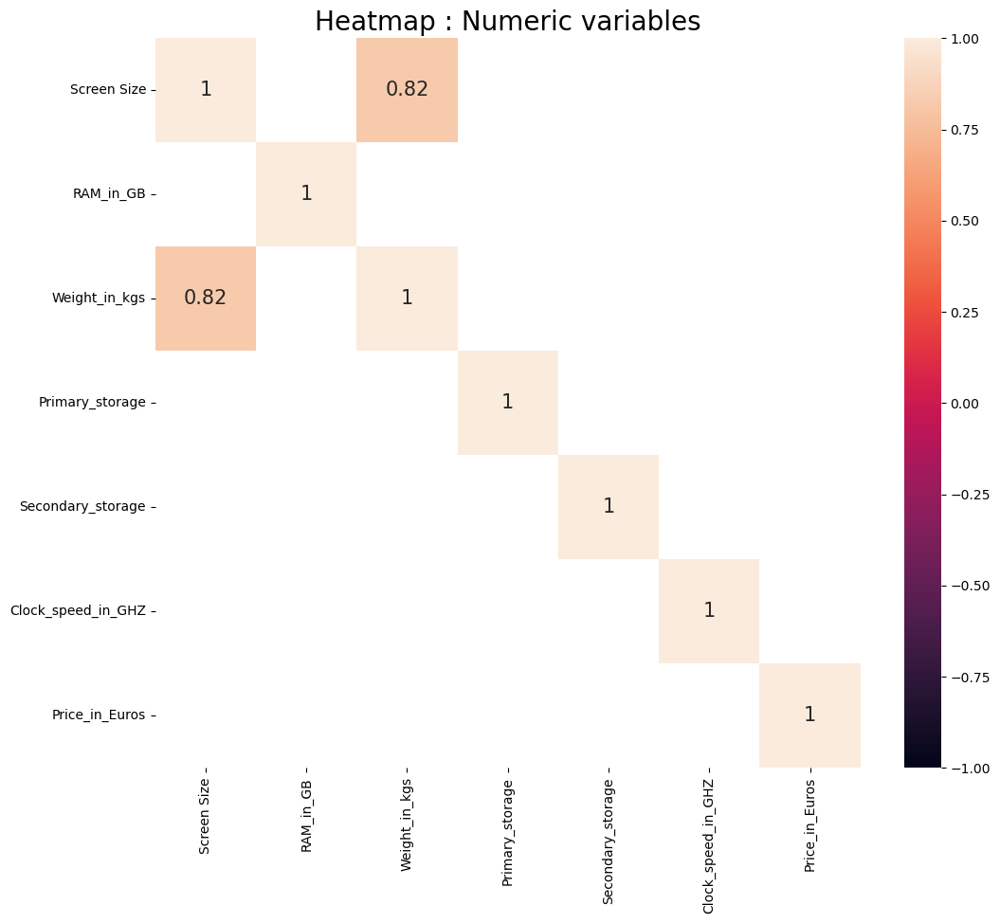

In [25]:
num_corr=numeric.corr()
plt.figure(figsize=(12,10))
sns.heatmap(num_corr[num_corr > 0.8],annot=True,vmin=-1 ,vmax=1,annot_kws={'size':15})
plt.title('Heatmap : Numeric variables',fontsize=20)
plt.show()

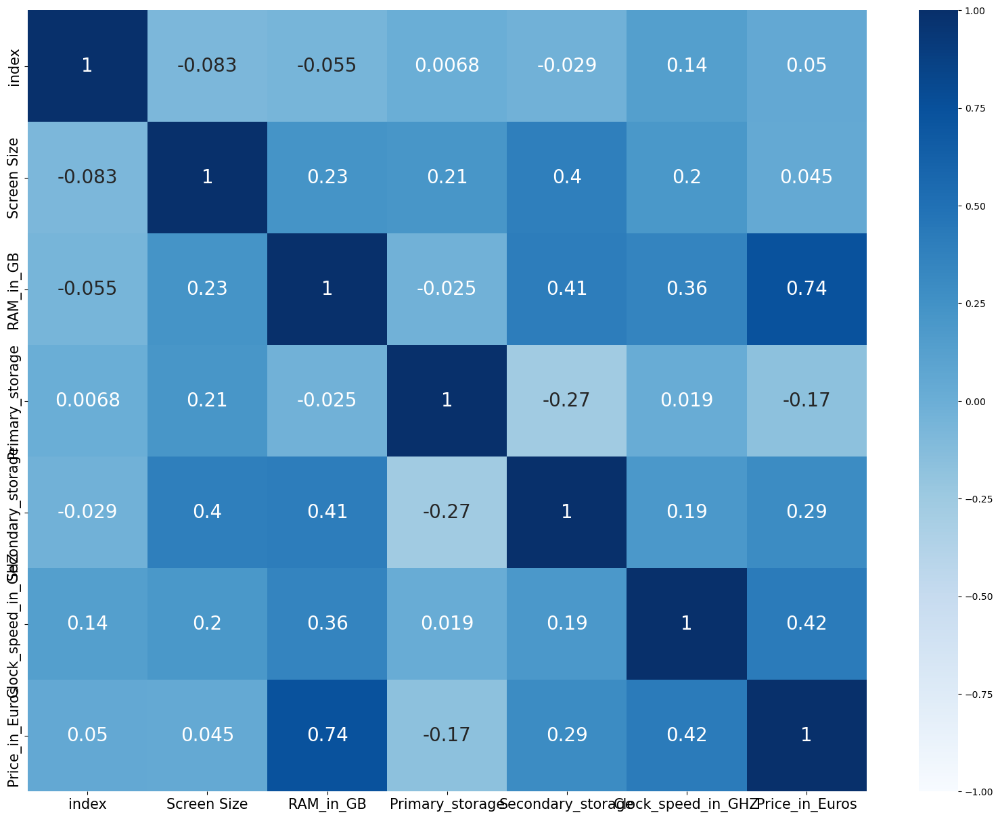

In [26]:
corr_matrix = numeric.corr()
correlation_range = (-0.8, 0.8)  
cols_to_drop = set()
for i in range(len(corr_matrix.columns)):
    for j in range(i):
        corr_value = corr_matrix.iloc[i, j]
        if not (correlation_range[0] <= abs(corr_value) <= correlation_range[1]):
            colname = corr_matrix.columns[i]
            cols_to_drop.add(colname)

# Drop the columns with correlation values outside the specified range
num_features = numeric.drop(cols_to_drop, axis=1).reset_index()

# Display the heatmap after removal
plt.figure(figsize=(20, 15))
sns.heatmap(num_features.corr(), cmap='Blues', vmax=1.0, vmin=-1.0, annot=True, annot_kws={"size": 20})
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show()

In [28]:
char_corr=char_dummies.corr()
char_corr

,Manufacturer_Apple,Manufacturer_Asus,Manufacturer_Dell,Manufacturer_Fujitsu,Manufacturer_HP,Manufacturer_Huawei,Manufacturer_LG,Manufacturer_Lenovo,Manufacturer_MSI,Manufacturer_Mediacom,Manufacturer_Microsoft,Manufacturer_Razer,Manufacturer_Samsung,Manufacturer_Toshiba,Manufacturer_Xiaomi,Model Name_14,Model Name_15,Model Name_17,Model Name_250,Model Name_255,Model Name_320,Model Name_A715,Model Name_ALIENWARE,Model Name_ASPIRE,Model Name_B51,Model Name_BLADE,Model Name_CB5,Model Name_CHROMEBOOK,Model Name_E5,Model Name_ELITEBOOK,Model Name_ENVY,Model Name_ES1,Model Name_EXTENSA,Model Name_F756UX,Model Name_FLEX,Model Name_FX502VM,Model Name_FX503VD,Model Name_FX503VM,Model Name_FX550IK,Model Name_FX553VD,Model Name_FX753VD,Model Name_FX753VE,Model Name_G701VO,Model Name_G752VY,Model Name_GE62,Model Name_GE63VR,Model Name_GE72,Model Name_GE72MVR,Model Name_GE72VR,Model Name_GE73VR,Model Name_GL553VE,Model Name_GL62,Model Name_GL62M,Model Name_GL72M,Model Name_GP62,Model Name_GP62M,Model Name_GP62MVR,Model Name_GP72M,Model Name_GP72MVR,Model Name_GP72VR,Model Name_GRAM,Model Name_GS40,Model Name_GS43VR,Model Name_GS60,Model Name_GS63VR,Model Name_GS70,Model Name_GS73VR,Model Name_GT62VR,Model Name_GT72S,Model Name_GT72VR,Model Name_GT73EVR,Model Name_GT73VR,Model Name_GT80S,Model Name_GV62,Model Name_GV62M,Model Name_IDEAPAD,Model Name_INSPIRON,Model Name_INSPRION,Model Name_K556UR,Model Name_K756UX,Model Name_LAPTOP,Model Name_LATITUDE,Model Name_LEGION,Model Name_LEOPARD,Model Name_LIFEBOOK,Model Name_MACBOOK,Model Name_MATEBOOK,Model Name_MI,Model Name_N23,Model Name_N42,Model Name_NITRO,Model Name_NOTEB,Model Name_NOTEBOOK,Model Name_OMEN,Model Name_PAVILION,Model Name_PL60,Model Name_PORTEGE,Model Name_PORTÉGÉ,Model Name_PRECISION,Model Name_PREDATOR,Model Name_PRO,Model Name_PROBOOK,Model Name_Q304UA,Model Name_Q524UQ,Model Name_Q534UX,Model Name_R558UA,Model Name_ROG,Model Name_SATELLITE,Model Name_SMARTBOOK,Model Name_SP315,Model Name_SPECTRE,Model Name_SPIN,Model Name_STREAM,Model Name_SURFACE,Model Name_SWIFT,Model Name_TECRA,Model Name_THINKPAD,Model Name_TMX349,Model Name_TP501UA,Model Name_TRAVELMATE,Model Name_UX410UA,Model Name_UX430UQ,Model Name_UX510UX,Model Name_V110,Model Name_V310,Model Name_V320,Model Name_V330,Model Name_V510,Model Name_VIVOBOOK,Model Name_VOSTRO,Model Name_X505BP,Model Name_X540SA,Model Name_X540UA,Model Name_X541UA,Model Name_X541UV,Model Name_X542UQ,Model Name_X550VX,Model Name_X553SA,Model Name_X555BP,Model Name_X555QG,Model Name_X556UJ,Model Name_X705UV,Model Name_X751SV,Model Name_XPS,Model Name_YOGA,Model Name_ZBOOK,Model Name_ZENBOOK,Category_Gaming,Category_Netbook,Category_Notebook,Category_Ultrabook,Category_Workstation,Operating System_Linux,Operating System_Mac OS,Operating System_No OS,Operating System_Windows,Operating System_macOS,Operating System Version_10 S,Operating System Version_7,Operating System Version_N/A,Operating System Version_X,Storage_Type_SSD,Resolution_1440x900,Resolution_1600x900,Resolution_1920x1080,Resolution_1920x1200,Resolution_2160x1440,Resolution_2256x1504,Resolution_2400x1600,Resolution_2560x1440,Resolution_2560x1600,Resolution_2880x1800,Resolution_3200x1800,Resolution_3840x2160,Display_4K Ultra HD / Touchscreen,Display_Full HD,Display_Full HD / Touchscreen,Display_IPS Panel,Display_IPS Panel 4K Ultra HD,Display_IPS Panel 4K Ultra HD / Touchscreen,Display_IPS Panel Full HD,Display_IPS Panel Full HD / Touchscreen,Display_IPS Panel Quad HD+,Display_IPS Panel Quad HD+ / Touchscreen,Display_IPS Panel Retina Display,Display_IPS Panel Touchscreen,Display_IPS Panel Touchscreen / 4K Ultra HD,Display_Quad HD+,Display_Quad HD+ / Touchscreen,Display_Touchscreen,Display_Touchscreen / 4K Ultra HD,Display_Touchscreen / Full HD,Display_Touchscreen / Quad HD+,Processor_AMD A10-Series 9620P,Processor_AMD A10-Series A10-9620P,Processor_AMD A12-Series 9700P,Processor_AMD A12-Series 9720P,Processor_AMD A4-Series 7210,Processor_AMD A6-Series 7310,Processor_AMD A6-Seri

In [1]:
plt.figure(figsize=(30,30))
sns.heatmap(char_corr[char_corr > 0.8],annot=True,vmin=-1,vmax=1)
plt.show()

NameError: name 'plt' is not defined

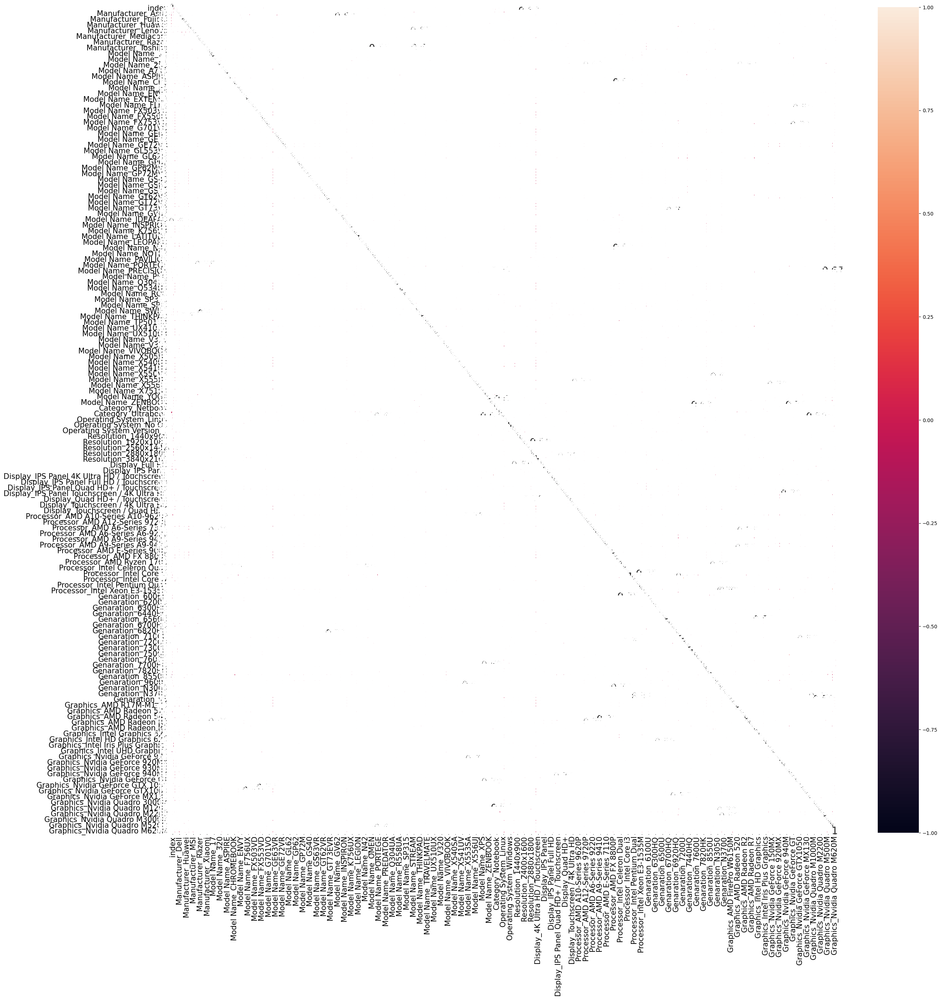

In [29]:
corr_matrix = char_dummies.corr()
correlation_range = (-0.8, 0.8)  
cols_to_drop = set()
for i in range(len(corr_matrix.columns)):
    for j in range(i):
        corr_value = corr_matrix.iloc[i, j]
        if not (correlation_range[0] <= abs(corr_value) <= correlation_range[1]):
            colname = corr_matrix.columns[i]
            cols_to_drop.add(colname)

# Drop the columns with correlation values outside the specified range
char_features = char_dummies.drop(cols_to_drop, axis=1).reset_index()

# Display the heatmap after removal
plt.figure(figsize=(30,30))
sns.heatmap(char_features.corr(), vmax=1.0, vmin=-1.0, annot=True, annot_kws={"size": 20})
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show()

In [30]:
num_features.shape,char_features.shape

((1200, 7), (1200, 289))

In [31]:
laptop=pd.concat([num_features,char_features],axis=1)
laptop.head(50)

,index,Screen Size,RAM_in_GB,Primary_storage,Secondary_storage,Clock_speed_in_GHZ,Price_in_Euros,index,Manufacturer_Apple,Manufacturer_Asus,Manufacturer_Dell,Manufacturer_Fujitsu,Manufacturer_HP,Manufacturer_Huawei,Manufacturer_LG,Manufacturer_Lenovo,Manufacturer_MSI,Manufacturer_Mediacom,Manufacturer_Microsoft,Manufacturer_Razer,Manufacturer_Samsung,Manufacturer_Toshiba,Manufacturer_Xiaomi,Model Name_14,Model Name_15,Model Name_17,Model Name_250,Model Name_255,Model Name_320,Model Name_A715,Model Name_ALIENWARE,Model Name_ASPIRE,Model Name_B51,Model Name_CB5,Model Name_CHROMEBOOK,Model Name_E5,Model Name_ELITEBOOK,Model Name_ENVY,Model Name_ES1,Model Name_EXTENSA,Model Name_F756UX,Model Name_FLEX,Model Name_FX502VM,Model Name_FX503VD,Model Name_FX503VM,Model Name_FX550IK,Model Name_FX553VD,Model Name_FX753VD,Model Name_FX753VE,Model Name_G701VO,Model Name_G752VY,Model Name_GE62,Model Name_GE63VR,Model Name_GE72,Model Name_GE72MVR,Model Name_GE72VR,Model Name_GE73VR,Model Name_GL553VE,Model Name_GL62,Model Name_GL62M,Model Name_GL72M,Model Name_GP62,Model Name_GP62M,Model Name_GP62MVR,Model Name_GP72M,Model Name_GP72MVR,Model Name_GP72VR,Model Name_GS40,Model Name_GS43VR,Model Name_GS60,Model Name_GS63VR,Model Name_GS70,Model Name_GS73VR,Model Name_GT62VR,Model Name_GT72S,Model Name_GT72VR,Model Name_GT73EVR,Model Name_GT73VR,Model Name_GT80S,Model Name_GV62,Model Name_GV62M,Model Name_IDEAPAD,Model Name_INSPIRON,Model Name_INSPRION,Model Name_K556UR,Model Name_K756UX,Model Name_LAPTOP,Model Name_LATITUDE,Model Name_LEGION,Model Name_LEOPARD,Model Name_N23,Model Name_N42,Model Name_NITRO,Model Name_NOTEB,Model Name_OMEN,Model Name_PAVILION,Model Name_PL60,Model Name_PORTEGE,Model Name_PORTÉGÉ,Model Name_PRECISION,Model Name_PREDATOR,Model Name_PRO,Model Name_PROBOOK,Model Name_Q304UA,Model Name_Q524UQ,Model Name_Q534UX,Model Name_R558UA,Model Name_ROG,Model Name_SATELLITE,Model Name_SP315,Model Name_SPECTRE,Model Name_SPIN,Model Name_STREAM,Model Name_SWIFT,Model Name_TECRA,Model Name_THINKPAD,Model Name_TMX349,Model Name_TP501UA,Model Name_TRAVELMATE,Model Name_UX410UA,Model Name_UX430UQ,Model Name_UX510UX,Model Name_V110,Model Name_V310,Model Name_V320,Model Name_V330,Model Name_V510,Model Name_VIVOBOOK,Model Name_VOSTRO,Model Name_X505BP,Model Name_X540SA,Model Name_X540UA,Model Name_X541UA,Model Name_X541UV,Model Name_X542UQ,Model Name_X550VX,Model Name_X553SA,Model Name_X555BP,Model Name_X555QG,Model Name_X556UJ,Model Name_X705UV,Model Name_X751SV,Model Name_XPS,Model Name_YOGA,Model Name_ZBOOK,Model Name_ZENBOOK,Category_Gaming,Category_Netbook,Category_Notebook,Category_Ultrabook,Category_Workstation,Operating System_Linux,Operating System_Mac OS,Operating System_No OS,Operating System_Windows,Operating System Version_7,Storage_Type_SSD,Resolution_1440x900,Resolution_1600x900,Resolution_1920x1080,Resolution_2400x1600,Resolution_2560x1440,Resolution_2560x1600,Resolution_2880x1800,Resolution_3200x1800,Resolution_3840x2160,Display_4K Ultra HD / Touchscreen,Display_Full HD,Display_Full HD / Touchscreen,Display_IPS Panel,Display_IPS Panel 4K Ultra HD,Display_IPS Panel 4K Ultra HD / Touchscreen,Display_IPS Panel Full HD,Display_IPS Panel Full HD / Touchscreen,Display_IPS Panel Quad HD+,Display_IPS Panel Quad HD+ / Touchscreen,Display_IPS Panel Touchscreen,Display_IPS Panel Touchscreen / 4K Ultra HD,Display_Quad HD+,Display_Quad HD+ / Touchscreen,Display_Touchscreen,Display_Touchscreen / 4K Ultra HD,Display_Touchscreen / Full HD,Display_Touchscreen / Quad HD+,Processor_AMD A10-Series 9620P,Processor_AMD A10-Series A10-9620P,Processor_AMD A12-Series 9700P,Processor_AMD A12-Series 9720P,Processor_AMD A4-Series 7210,Processor_AMD A6-Series 7310,Processor_AMD A6-Series 9220,Processor_AMD A6-Series A6-9220,Processor_AMD A8-Series 7410,Processor_AMD A9-Series 9410,Processor_AMD A9-Series 9420,Processor_AMD A9-Series A9-9420,Processor_AMD E-Series 7110,Processor_AMD E-Series 9000,Processor_AMD E-Series E2-9000,Processor_AMD FX 8800P,

In [32]:
laptop.isnull().sum()

index                                          0
Screen Size                                    0
RAM_in_GB                                      0
Primary_storage                                0
Secondary_storage                              0
Clock_speed_in_GHZ                             0
Price_in_Euros                                 0
index                                          0
Manufacturer_Apple                             0
Manufacturer_Asus                              0
Manufacturer_Dell                              0
Manufacturer_Fujitsu                           0
Manufacturer_HP                                0
Manufacturer_Huawei                            0
Manufacturer_LG                                0
Manufacturer_Lenovo                            0
Manufacturer_MSI                               0
Manufacturer_Mediacom                          0
Manufacturer_Microsoft                         0
Manufacturer_Razer                             0
Manufacturer_Samsung

# Model Building

In [33]:
laptop=sm.add_constant(laptop)
y=laptop['Price_in_Euros']
X=laptop.drop('Price_in_Euros',axis=1)

In [34]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.3,random_state=10)


In [35]:
X_train.shape,X_test.shape,y_train.shape,y_test.shape

((840, 296), (360, 296), (840,), (360,))

In [36]:
# function to find the R squared adjusted
def adj_r2(model):
    n = len(X_test)
    k = X_test.shape[1]
    dt_r2 =model.score(X_test, y_test)
    dt_adj_r2 = 1 -((1-dt_r2)*(n-1)/(n-k-1))
    return dt_adj_r2

## Linear Regression

In [37]:
linear_regression_ols=sm.OLS(y_train,X_train).fit()
print(linear_regression_ols.summary())

                            OLS Regression Results                            
Dep. Variable:         Price_in_Euros   R-squared:                       0.943
Model:                            OLS   Adj. R-squared:                  0.920
Method:                 Least Squares   F-statistic:                     40.25
Date:                Sat, 24 Feb 2024   Prob (F-statistic):          1.34e-265
Time:                        17:46:27   Log-Likelihood:                -5505.0
No. Observations:                 840   AIC:                         1.150e+04
Df Residuals:                     594   BIC:                         1.267e+04
Df Model:                         245                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

In [38]:
linear_regression_ols_pred=linear_regression_ols.predict(X_test)

In [39]:
predict_price=pd.Series(linear_regression_ols_pred)
actual_price=y_test

In [40]:
model_rmse=rmse(predict_price,actual_price)
model_mse=metrics.mean_squared_error(actual_price,predict_price)
model_rsquared=linear_regression_ols.rsquared
model_rsquared_abj=linear_regression_ols.rsquared_adj
print(f'MSE: {model_mse} \nRMSE :{model_rmse} \nSquared : {model_rsquared} \nAdjucted R Squared :{model_rsquared_abj}')

MSE: 91347.11071045464 
RMSE :302.2368453886035 
Squared : 0.9431851656990179 
Adjucted R Squared :0.9197514377465926


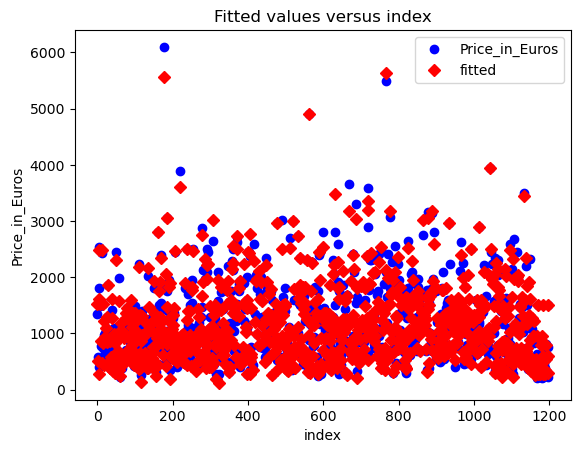

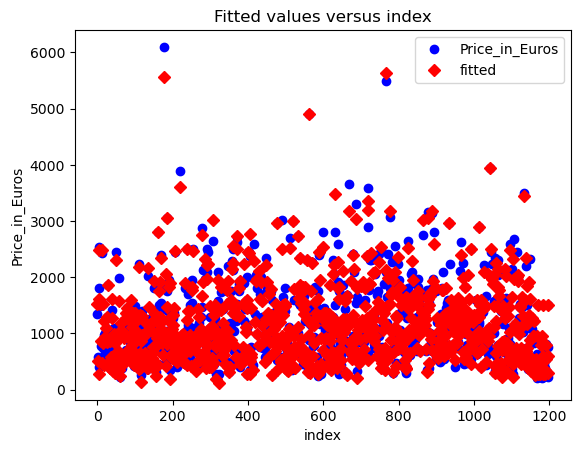

In [41]:
sm.graphics.plot_fit(linear_regression_ols,1, vlines=False)

In [133]:
cols = ['Model','MSE', 'RMSE', 'R-Squared', 'Adj. R-Squared']
result_tabulation = pd.DataFrame(columns = cols)
linreg_logmodel_full_metrics = pd.Series({'Model': "Linear Regression ",
                                          'MSE':model_mse,
                                          'RMSE':model_rmse,
                                          'R-Squared': model_rsquared,
                                          'Adj. R-Squared': model_rsquared_abj     
                   })
result_tabulation = result_tabulation._append(linreg_logmodel_full_metrics, ignore_index = True)
result_tabulation

,Model,MSE,RMSE,R-Squared,Adj. R-Squared
0,Linear Regression,0.192053,0.438239,0.943185,0.919751


## Decision Tree

In [134]:
decisiontree=DecisionTreeRegressor(criterion='squared_error')
decisiontree.fit(X_train,y_train)

DecisionTreeRegressor()

In [135]:
predict_price=decisiontree.predict(X_test)
actual_price=y_test

In [136]:
MAE=metrics.mean_absolute_error(actual_price,predict_price)
MSE=metrics.mean_squared_error(actual_price,predict_price)
RMSE=np.sqrt(metrics.mean_squared_error(actual_price,predict_price))
R2_SCORE=metrics.r2_score(actual_price,predict_price)
R2_ADJ=adj_r2(decisiontree)

print(f'MAE : {MAE} \nMSE : {MSE} \nRMSE : {RMSE} \nR Squred : {R2_SCORE} \nR Squared Adj : {R2_ADJ}')

MAE : 0.3265738234227355 
MSE : 0.2575876758012627 
RMSE : 0.5075309604361715 
R Squred : 0.6914117006074538 
R Squared Adj : -0.7584634838400646


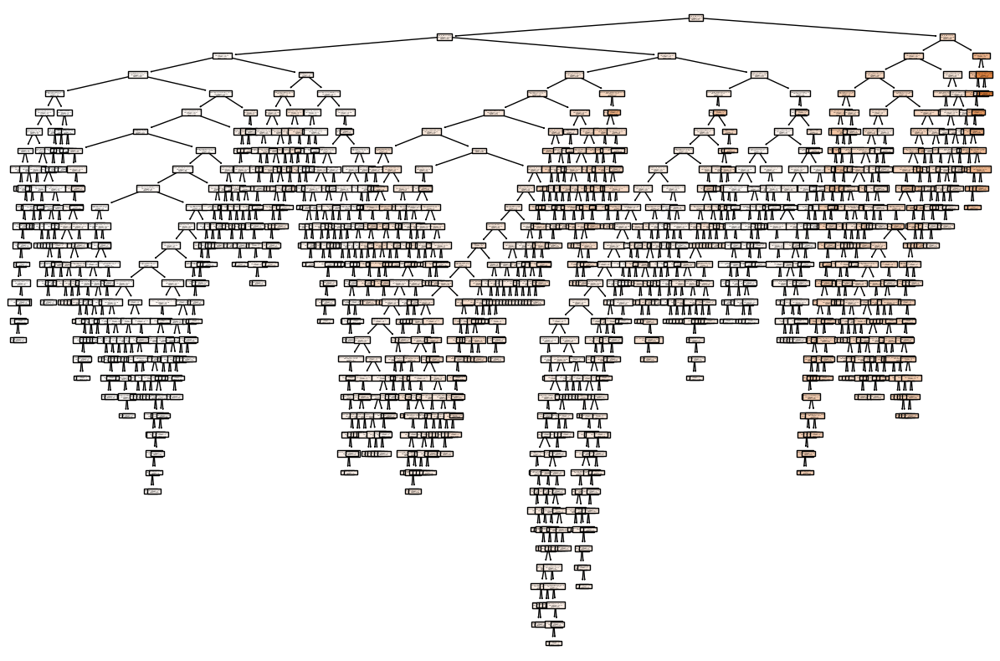

In [156]:
fig,ax = plt.subplots(figsize=(15,10))
plot_tree(decisiontree,feature_names=list(X.columns),filled=True);

In [137]:

linreg_logmodel_full_metrics = pd.Series({'Model': "Decision Tree",
                                          'MSE':MSE,
                                          'RMSE':RMSE,
                                          'R-Squared': R2_SCORE,
                                          'Adj. R-Squared': R2_ADJ     
                   })
result_tabulation = result_tabulation._append(linreg_logmodel_full_metrics, ignore_index = True)
result_tabulation

,Model,MSE,RMSE,R-Squared,Adj. R-Squared
0,Linear Regression,0.192053,0.438239,0.943185,0.919751
1,Decision Tree,0.257588,0.507531,0.691412,-0.758463


## Decision Tree with GridSearchCV

In [138]:

param_grid = {"criterion": ["squared_error"],
              "min_samples_split": [50, 60, 70],
              "max_depth": [25,30,35],
              "min_samples_leaf": [30, 40, 100],
              "max_leaf_nodes": [70, 80, 100],
              }

decisiontree_grid_search = GridSearchCV(DecisionTreeRegressor(), param_grid, cv=5, error_score='raise')


In [139]:
grid_search=decisiontree_grid_search.fit(X_train,y_train)

In [140]:
print(grid_search.best_params_)

{'criterion': 'squared_error', 'max_depth': 25, 'max_leaf_nodes': 70, 'min_samples_leaf': 30, 'min_samples_split': 70}


In [141]:
dt_grid_search=DecisionTreeRegressor(max_depth=grid_search.best_params_.get('max_depth'),
                                   max_leaf_nodes=grid_search.best_params_.get('max_leaf_nodes'),
                                   min_samples_leaf=grid_search.best_params_.get('min_samples_leaf'),
                                   min_samples_split=grid_search.best_params_.get('min_samples_split')
                                   ,random_state=10 )

dt_grid_search=dt_grid_search.fit(X_train,y_train)


In [142]:
predict_price=decisiontree_grid_search.predict(X_test)
actual_price=y_test

In [143]:
MAE=metrics.mean_absolute_error(actual_price,predict_price)
MSE=metrics.mean_squared_error(actual_price,predict_price)
RMSE=np.sqrt(metrics.mean_squared_error(actual_price,predict_price))
R2_SCORE=metrics.r2_score(actual_price,predict_price)
R2_ADJ=adj_r2(decisiontree_grid_search)

print(f'MAE : {MAE} \nMSE : {MSE} \nRMSE : {RMSE} \nR Squred : {R2_SCORE} \nR Squared Adj : {R2_ADJ}')

MAE : 0.37807128250757893 
MSE : 0.29310403177912747 
RMSE : 0.5413908308968 
R Squred : 0.6488633455367494 
R Squared Adj : -1.0009215706715393


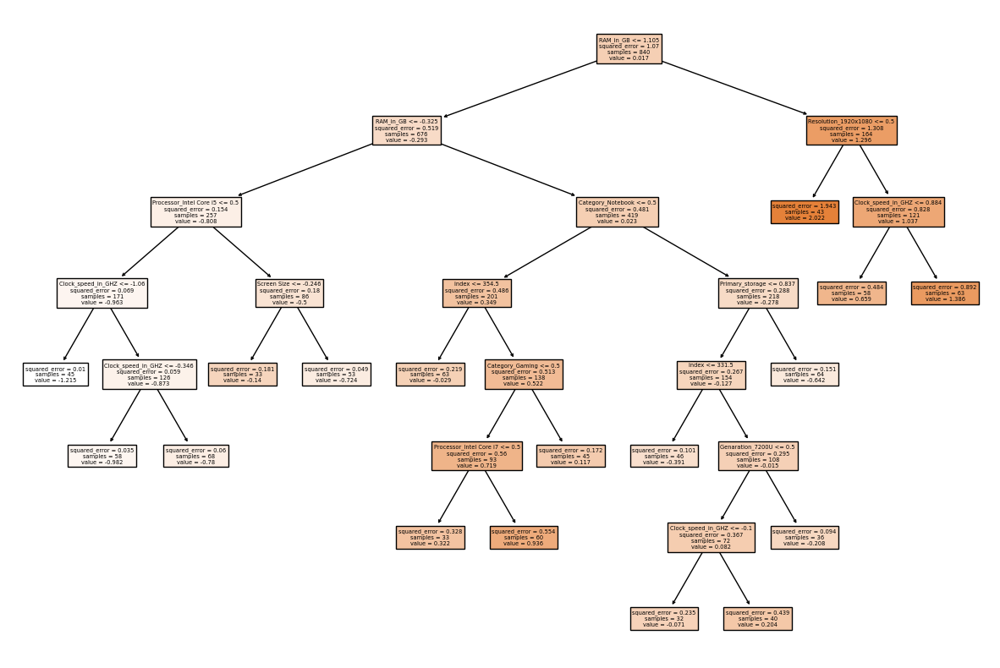

In [157]:
fig,ax = plt.subplots(figsize=(15,10))
plot_tree(dt_grid_search,feature_names=list(X.columns),filled=True);

In [144]:

linreg_logmodel_full_metrics = pd.Series({'Model': "Decision Tree with GridSearchCV",
                                          'MSE':MSE,
                                          'RMSE':RMSE,
                                          'R-Squared': R2_SCORE,
                                          'Adj. R-Squared': R2_ADJ     
                   })
result_tabulation = result_tabulation._append(linreg_logmodel_full_metrics, ignore_index = True)
result_tabulation

,Model,MSE,RMSE,R-Squared,Adj. R-Squared
0,Linear Regression,0.192053,0.438239,0.943185,0.919751
1,Decision Tree,0.257588,0.507531,0.691412,-0.758463
2,Decision Tree with GridSearchCV,0.293104,0.541391,0.648863,-1.000922


## Random Forest

In [158]:
rf_reg=RandomForestRegressor(n_estimators=500,random_state=10,criterion='squared_error')

rf_reg.fit(X_train,y_train)

RandomForestRegressor(n_estimators=500, random_state=10)

In [146]:
predict_price=rf_reg.predict(X_test)
actual_price=y_test

In [147]:
MAE=metrics.mean_absolute_error(actual_price,predict_price)
MSE=metrics.mean_squared_error(actual_price,predict_price)
RMSE=np.sqrt(metrics.mean_squared_error(actual_price,predict_price))
R2_SCORE=metrics.r2_score(actual_price,predict_price)
R2_ADJ=adj_r2(rf_reg)

print(f'MAE : {MAE} \nMSE : {MSE} \nRMSE : {RMSE} \nR Squred : {R2_SCORE} \nR Squared Adj : {R2_ADJ}')

MAE : 0.24306649579792014 
MSE : 0.1399720289279042 
RMSE : 0.37412835889291285 
R Squred : 0.8323144527973784 
R Squared Adj : 0.044458548480298954


In [148]:

linreg_logmodel_full_metrics = pd.Series({'Model': "Random Forest",
                                          'MSE':MSE,
                                          'RMSE':RMSE,
                                          'R-Squared': R2_SCORE,
                                          'Adj. R-Squared': R2_ADJ     
                   })
result_tabulation = result_tabulation._append(linreg_logmodel_full_metrics, ignore_index = True)
result_tabulation

,Model,MSE,RMSE,R-Squared,Adj. R-Squared
0,Linear Regression,0.192053,0.438239,0.943185,0.919751
1,Decision Tree,0.257588,0.507531,0.691412,-0.758463
2,Decision Tree with GridSearchCV,0.293104,0.541391,0.648863,-1.000922
3,Random Forest,0.139972,0.374128,0.832314,0.044459


## Random Forest with GridSearchCV

In [149]:
param_grid = {"criterion": ["squared_error"],
              "min_samples_split": [20, 30, 40],
              "max_depth": [20,25,30],
              "min_samples_leaf": [20, 40, 50],
              "max_leaf_nodes": [20, 30,50],
              }

rf_grid_search = GridSearchCV(RandomForestRegressor(), param_grid, cv=5, error_score='raise')

In [159]:
rf_best_fit=rf_grid_search.fit(X_train,y_train)
rf_best_fit

DecisionTreeRegressor(max_depth=25, max_leaf_nodes=30, min_samples_leaf=20,
                      min_samples_split=30, random_state=10)

In [151]:
rf_best_fit.best_params_

{'criterion': 'squared_error',
 'max_depth': 25,
 'max_leaf_nodes': 30,
 'min_samples_leaf': 20,
 'min_samples_split': 30}

In [152]:
rf_grid_search=DecisionTreeRegressor(max_depth=rf_best_fit.best_params_.get('max_depth'),
                                   max_leaf_nodes=rf_best_fit.best_params_.get('max_leaf_nodes'),
                                   min_samples_leaf=rf_best_fit.best_params_.get('min_samples_leaf'),
                                   min_samples_split=rf_best_fit.best_params_.get('min_samples_split')
                                   ,random_state=10 )

rf_grid_search=rf_grid_search.fit(X_train,y_train)


In [153]:
predict_price=rf_grid_search.predict(X_test)
actual_price=y_test

In [154]:
MAE=metrics.mean_absolute_error(actual_price,predict_price)
MSE=metrics.mean_squared_error(actual_price,predict_price)
RMSE=np.sqrt(metrics.mean_squared_error(actual_price,predict_price))
R2_SCORE=metrics.r2_score(actual_price,predict_price)
R2_ADJ=adj_r2(rf_grid_search)

print(f'MAE : {MAE} \nMSE : {MSE} \nRMSE : {RMSE} \nR Squred : {R2_SCORE} \nR Squared Adj : {R2_ADJ}')

MAE : 0.35798891601327243 
MSE : 0.27039055744639906 
RMSE : 0.5199909205422717 
R Squred : 0.6760739346918017 
R Squared Adj : -0.8458644038990986


In [155]:

linreg_logmodel_full_metrics = pd.Series({'Model': "Random Forest with GridSearchCV",
                                          'MSE':MSE,
                                          'RMSE':RMSE,
                                          'R-Squared': R2_SCORE,
                                          'Adj. R-Squared': R2_ADJ     
                   })
result_tabulation = result_tabulation._append(linreg_logmodel_full_metrics, ignore_index = True)
result_tabulation

,Model,MSE,RMSE,R-Squared,Adj. R-Squared
0,Linear Regression,0.192053,0.438239,0.943185,0.919751
1,Decision Tree,0.257588,0.507531,0.691412,-0.758463
2,Decision Tree with GridSearchCV,0.293104,0.541391,0.648863,-1.000922
3,Random Forest,0.139972,0.374128,0.832314,0.044459
4,Random Forest with GridSearchCV,0.270391,0.519991,0.676074,-0.845864


# Conclusion
    
#### The Laptops dataset is processed and the models are builts, among the models LINEAR REGRESSION (OLS) has given the maximum accuracy of 91 %.